In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns

In [2]:
#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
#evaluation
from sklearn.metrics import silhouette_score

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform
# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

In [4]:
df = pd.read_csv("project_dataset/dataset.csv", sep="\t", index_col=0)
df

,name,explicit,artists,album_name,key,mode,time_signature,genre,duration_ms,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,Long Road,False,Funki Porcini,Hed Phone Sex,5,1.0,4.0,j-dance,0.053798,0.522727,0.687095,0.512990,0.684705,0.082251,0.303213,0.536000,0.274226,0.638191,0.588314
1,"Daniâl My Son, Where Did You Vanish?",False,Siavash Amini,A Trail of Laughters,1,0.0,4.0,iranian,0.103137,0.000000,0.017048,0.195984,0.438016,0.063532,0.284137,0.934000,0.354642,0.033769,0.238030
2,Ondskapens Galakse,False,Kvelertak,Nattesferd,2,1.0,4.0,black-metal,0.076181,0.034091,0.334268,0.853997,0.786902,0.018608,0.000090,0.800000,0.254886,0.491457,0.453757
3,Can't Look Away,False,The Wood Brothers,One Drop of Truth,5,1.0,4.0,bluegrass,0.060639,0.261364,0.506905,0.584992,0.823849,0.059128,0.066667,0.001270,0.107288,0.386935,0.581263
4,Thunderground,False,The Darkraver;DJ Vince,Happy Hardcore Top 100,7,1.0,4.0,happy,0.069873,0.284091,0.636383,0.686994,0.708606,0.034244,0.000578,0.096900,0.292549,0.640201,0.597435
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14608,Outpt,False,Autechre,EP7,1,1.0,4.0,idm,0.100216,0.000000,0.540354,0.656993,0.650471,0.036336,0.016064,0.615000,0.122557,0.033668,0.457390
14609,Natural Environment Sounds: To Improve Sleep a...,False,Natural White Noise Relaxation,Baby Sleep White Noise: Ultimate Album to Help...,1,1.0,3.0,sleep,0.039401,0.500000,0.053733,0.859997,0.542023,0.040410,0.550201,0.940000,0.113396,0.001608,0.325973
14610,Psychological Attack,False,Droplex,Psychological Attack,1,1.0,4.0,techno,0.092425,0.488636,0.804704,0.534991,0.753573,0.040299,0.001837,0.857000,0.060770,0.071156,0.503031
14611,Don't Hate The 808 (feat. Lafa Taylor),False,Bassnectar;Lafa Taylor,Noise vs Beauty,5,1.0,4.0,breakbeat,0.042940,0.420455,0.493958,0.969999,0.890345,0.033363,0.000338,0.000014,0.397394,0.271357,0.682019


In [8]:
df[df["key"]==4] 

,name,explicit,artists,album_name,key,mode,time_signature,genre,duration_ms,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
7,Quiero tener tu presencia,False,Seguridad Social,Furia Latina,4,1.0,4.0,spanish,0.048642,0.727273,0.742123,0.815996,0.824050,0.062651,0.021185,0.000000,0.088050,0.576884,0.608576
9,Into The Pentagram,False,Samael,Worship Him,4,1.0,4.0,black-metal,0.093818,0.238636,0.278161,0.728995,0.794902,0.012993,0.000116,0.222000,0.217223,0.119598,0.583608
13,知足,False,Mayday,知足 just my pride 最真傑作選,4,1.0,4.0,mandopop,0.057441,0.579545,0.380665,0.229984,0.755503,0.007597,0.883534,0.000000,0.097109,0.396985,0.681335
31,H.O.P.E.,False,Hozho,"Singles Collection, Vol. 1",4,1.0,4.0,techno,0.133823,0.375000,0.710833,0.473989,0.701067,0.031711,0.066667,0.745000,0.089780,0.084322,0.508425
40,The Light Tears Apart,False,Shivered,Journey to Fade,4,0.0,4.0,iranian,0.057440,0.000000,0.420587,0.931999,0.834322,0.053623,0.000025,0.001780,0.369910,0.456281,0.681446
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14544,Construção - L_cio & K_Ri Version,False,L_cio,Chico Buarque Construção Revisited,4,0.0,4.0,techno,0.103324,0.352273,0.676306,0.652993,0.764106,0.009689,0.025100,0.370000,0.081128,0.778894,0.503068
14579,風に吹かれても,False,Keyakizaka46,永遠より長い一瞬 ~あの頃、確かに存在した私たち~(Complete Edition),4,0.0,4.0,j-idol,0.048857,0.238636,0.703280,0.905998,0.881601,0.105924,0.345382,0.000000,0.322068,0.855276,0.502637
14586,Guerra Batalha,False,BaianaSystem;Liz Reis,Oxeaxeexu,4,0.0,4.0,afrobeat,0.030437,0.318182,0.414113,0.356987,0.783786,0.007267,0.678715,0.000001,0.108306,0.261307,0.471948
14598,Fudge,False,StopLock,Fudge,4,0.0,4.0,study,0.026504,0.113636,0.413034,0.367987,0.634692,0.538648,0.923695,0.452000,0.049471,0.188945,0.287966


In [4]:
num_data = df[["duration_ms", "popularity", "danceability", "energy", "loudness", "speechiness", "acousticness", "instrumentalness", "liveness", "valence", "tempo"]].values

In [5]:
def get_linkage_matrix(model):
    # Create linkage matrix 
    
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    return linkage_matrix

def plot_dendrogram(model, **kwargs):
    linkage_matrix = get_linkage_matrix(model)
    dendrogram(linkage_matrix, **kwargs)

# Complete link

In [6]:
completeModel = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='euclidean', linkage='complete')
completeModel = completeModel.fit(num_data)

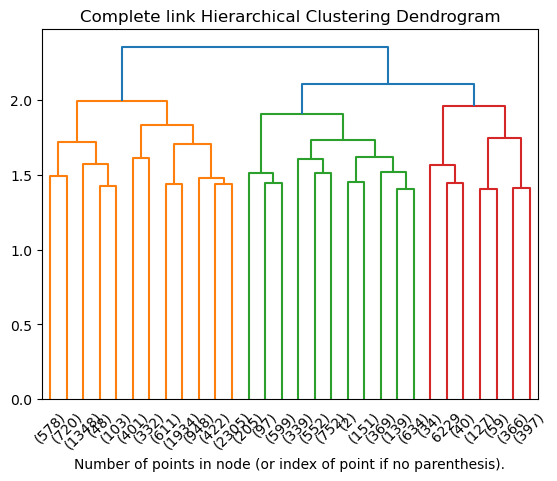

In [7]:
plt.title("Complete link Hierarchical Clustering Dendrogram")
plot_dendrogram(completeModel, truncate_mode='lastp', color_threshold=2.1)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [8]:
Z = get_linkage_matrix(completeModel)
completeLabels = fcluster(Z, t=2.1, criterion='distance')
completeLabels

array([1, 3, 1, ..., 1, 1, 2], dtype=int32)

In [9]:
print('Silhouette', silhouette_score(num_data, completeLabels))

Silhouette 0.17591310558820525


# Single link

In [10]:
singleModel = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='euclidean', linkage='single')
singleModel = singleModel.fit(num_data)

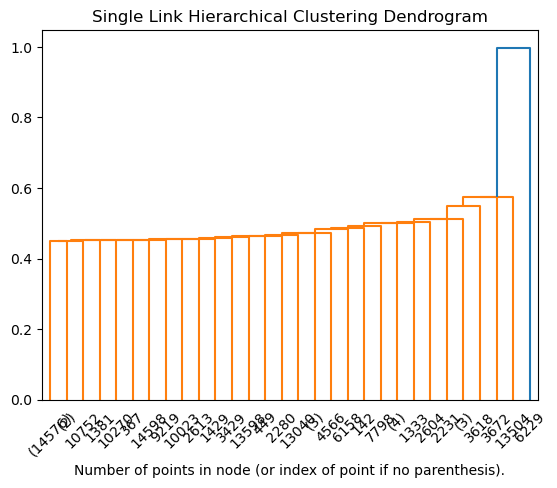

In [11]:
plt.title("Single Link Hierarchical Clustering Dendrogram")
plot_dendrogram(singleModel, truncate_mode='lastp', color_threshold=0.8)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [12]:
Z = get_linkage_matrix(singleModel)
singleLabels = fcluster(Z, t=0.8, criterion='distance')
singleLabels

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

In [13]:
print('Silhouette', silhouette_score(num_data, singleLabels))

Silhouette 0.36798032291184635


# Average link

In [14]:
averageModel = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='euclidean', linkage='average')
averageModel = averageModel.fit(num_data)

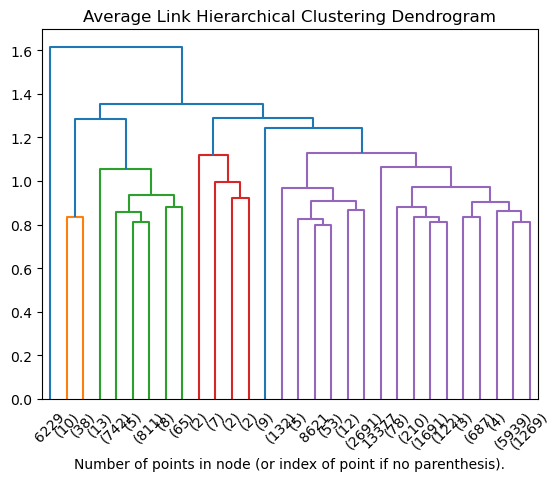

In [15]:
plt.title("Average Link Hierarchical Clustering Dendrogram")
plot_dendrogram(averageModel, truncate_mode='lastp', color_threshold=1.2)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [16]:
Z = get_linkage_matrix(averageModel)
averageLabels = fcluster(Z, t=1.2, criterion='distance')
averageLabels

array([5, 5, 5, ..., 5, 5, 5], dtype=int32)

In [17]:
print('Silhouette', silhouette_score(num_data, averageLabels))

Silhouette 0.19725711446234206


# Ward link

In [18]:
wardModel = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='euclidean', linkage='ward')
wardModel = wardModel.fit(num_data)

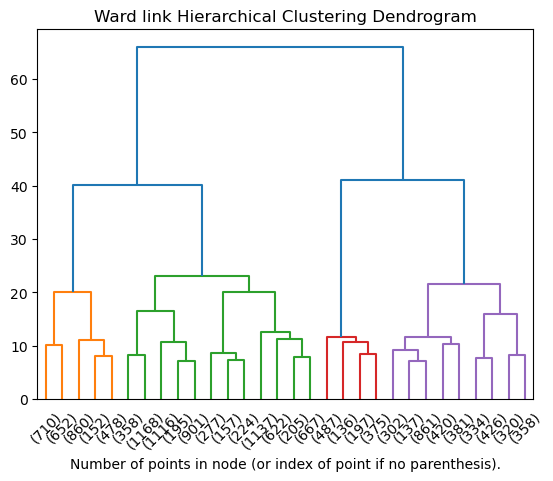

In [19]:
plt.title("Ward link Hierarchical Clustering Dendrogram")
plot_dendrogram(wardModel, truncate_mode='lastp', color_threshold=25)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [20]:
Z = get_linkage_matrix(wardModel)
wardLabels = fcluster(Z, t=25, criterion='distance')
wardLabels

array([4, 4, 4, ..., 4, 2, 1], dtype=int32)

In [21]:
print('Silhouette', silhouette_score(num_data, wardLabels))

Silhouette 0.22825017374267753


danceability  -  tempo


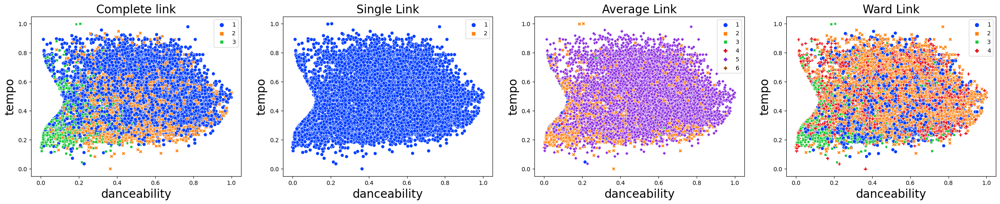

danceability  -  energy


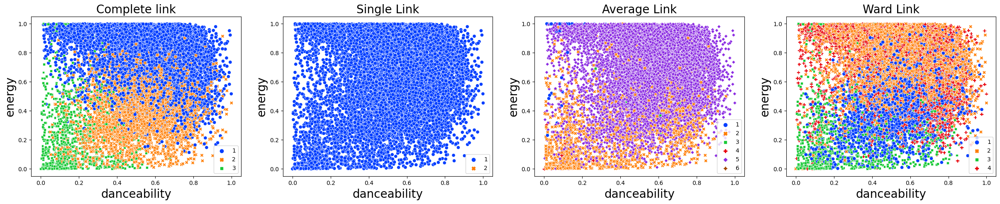

danceability  -  loudness


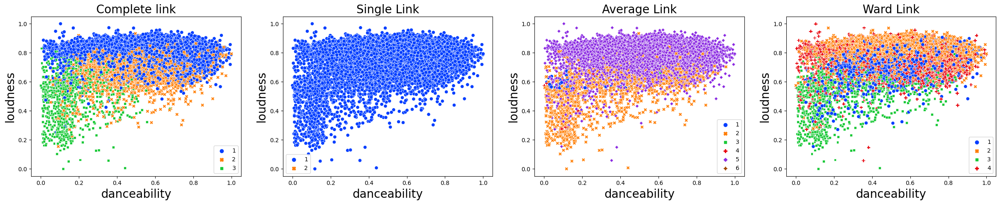

danceability  -  acousticness


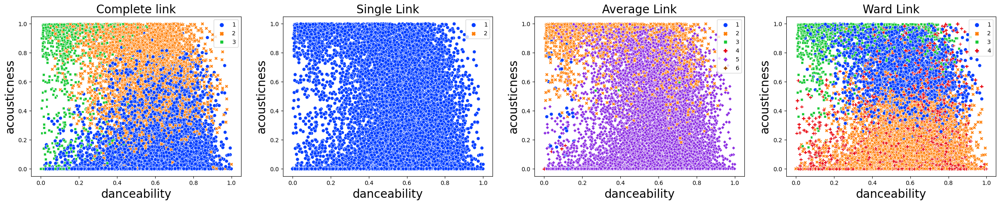

danceability  -  instrumentalness


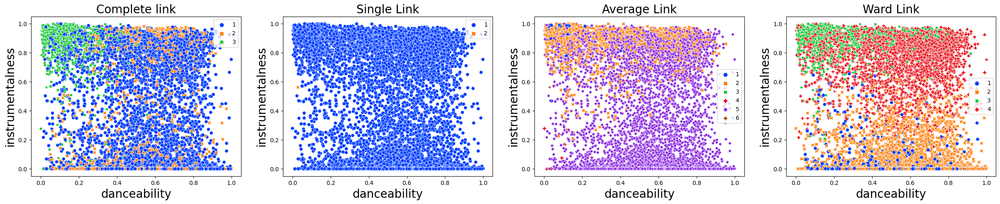

tempo  -  energy


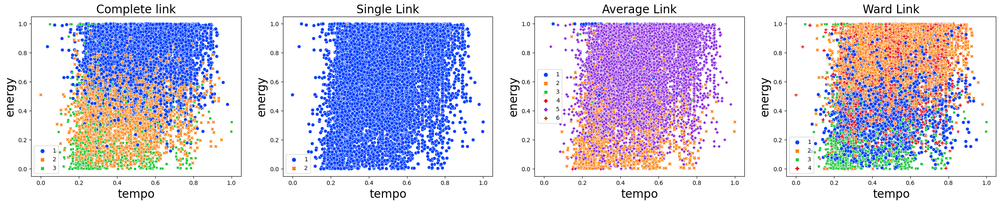

tempo  -  loudness


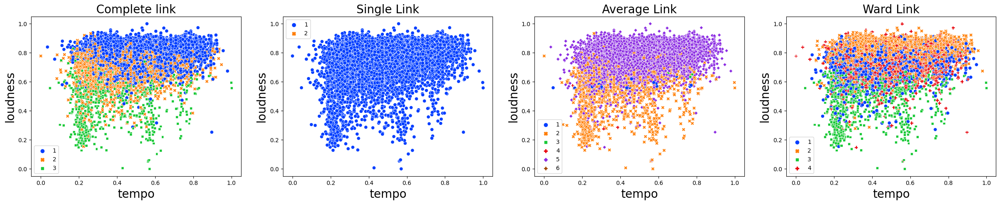

tempo  -  acousticness


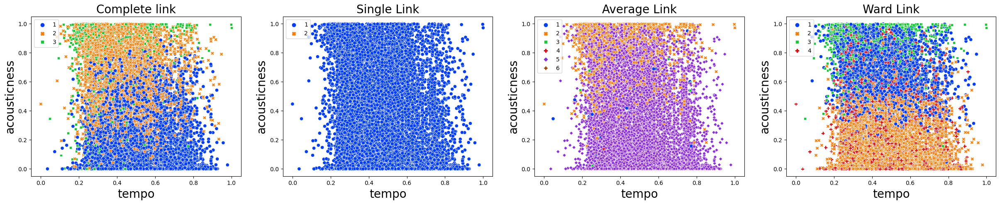

tempo  -  instrumentalness


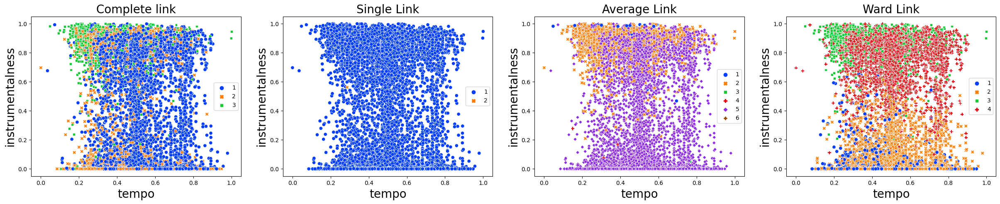

energy  -  loudness


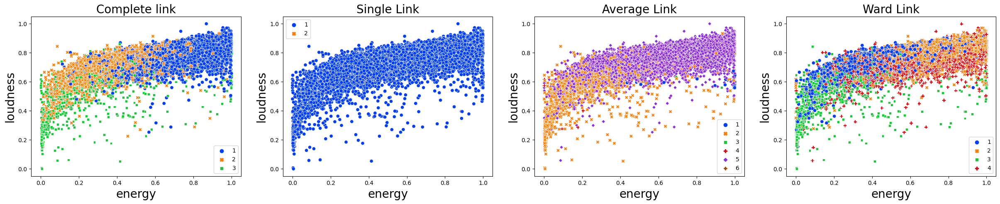

energy  -  acousticness


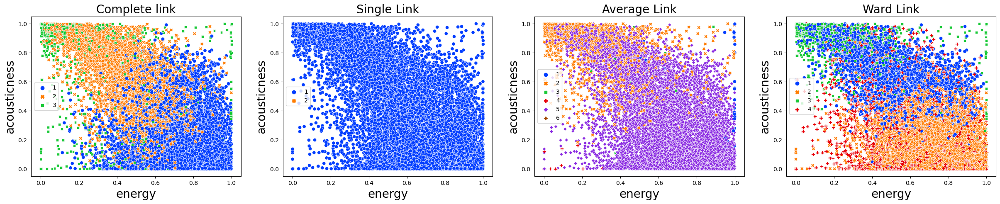

energy  -  instrumentalness


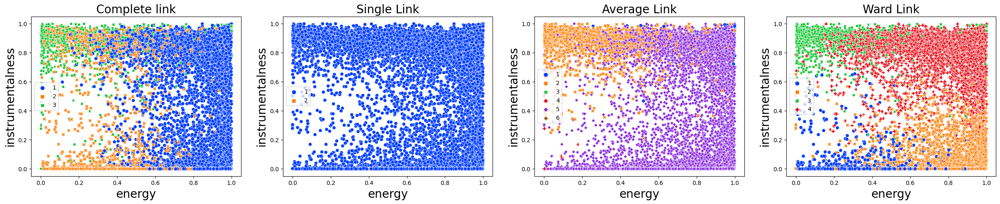

loudness  -  acousticness


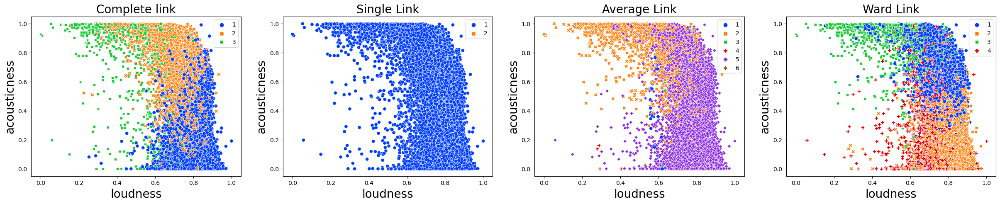

loudness  -  instrumentalness


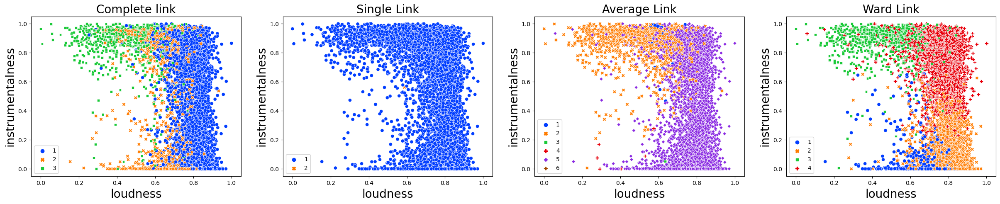

acousticness  -  instrumentalness


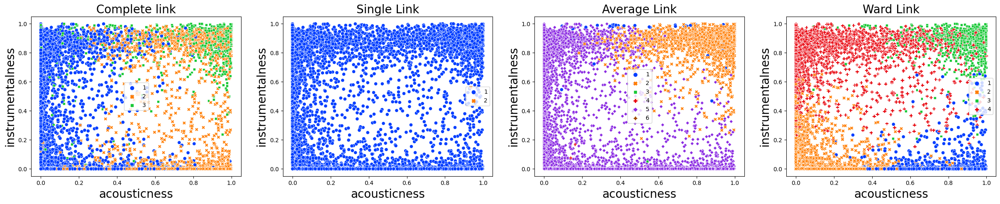

In [22]:
labelsName = ["Complete link", "Single Link", "Average Link", "Ward Link"]
labels = [completeLabels, singleLabels, averageLabels, wardLabels]

features = ["danceability", "tempo","energy", "loudness", "acousticness", "instrumentalness"]
listaCoppie = []
for i in range(len(features)):
    for j in range(i+1, len(features)):
        listaCoppie.append((features[i], features[j]))
        
x = "instrumentalness"
y = "acousticness"


for elem in listaCoppie:
    print(elem[0], " - ", elem[1])
    fig, axes = plt.subplots(1, 4, figsize=(30, 5))
    axes = axes.flatten()
    for i in range(len(labels)):
        sns.scatterplot(data=df,
                    ax=axes[i], 
                    x=elem[0],
                    y=elem[1],
                    hue=labels[i],
                    style=labels[i],
                    palette="bright")
        axes[i].set_title(labelsName[i], fontsize=20)
        axes[i].yaxis.label.set_size(20)
        axes[i].xaxis.label.set_size(20)
    plt.show()

